## Supply Chain: Predicting High Risk Deliveries


In [1]:
#conda install -c anaconda py-xgboost
#!conda install nbconvert[webpdf]
#!conda install -c conda-forge pandoc
#conda install -c conda-forge/label/cf201901 pandoc
#!conda install pandoc-2.17.1.1-h57928b3_0.tar.bz2  

In [2]:
# Install/ Import libraries :

import pandas as pd
import numpy as np
import string
import re
import sys
from pathlib import Path
import os
import csv
import openpyxl
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import seaborn as sns

import xgboost as xgb
import lightgbm as lgb
import datetime as dt
#import calendar,warnings,itertools,matplotlib,keras,shutil
#import tensorflow as tf
import statsmodels.api as sm
from datetime import datetime
from sklearn.model_selection import train_test_split,cross_val_score, cross_val_predict
from sklearn import svm,metrics,tree,preprocessing,linear_model
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Ridge,LinearRegression,LogisticRegression,ElasticNet, Lasso
from sklearn.ensemble import RandomForestRegressor,RandomForestClassifier, GradientBoostingRegressor,BaggingClassifier,ExtraTreesClassifier
from sklearn.metrics import accuracy_score,mean_squared_error,recall_score,confusion_matrix,f1_score,roc_curve, auc
from sklearn.datasets import load_iris,make_regression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.kernel_ridge import KernelRidge
#from keras import Sequential
#from keras.layers import Dense
from IPython.core import display as ICD
# from tensorflow_core.estimator import inputs

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder


#Hiding the warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
import matplotlib.ticker as ticker

In [75]:
# saved as xlsx - using openpyxl:

df_xls = pd.read_excel("Company PO data for analysis2.xlsx", engine= "openpyxl")

In [76]:
df_xls.head(5)

,Purch.Doc.,purch doc match on EKBE?,Item,concat,EKET DELIVERY DATE,EKET Stat.Rel Del Date,EKET Orig. Del Date,Matl Doc from EKBE_,Doc date _from EKBE USING Matl Doc_,Doc date _from EKBE USING PURCH&ITEM_,...,Committed Quantity,HgLvIt PQR,Reference Item,Origin Profile,Key in Source System,Indicator for Putting Back from Grouped,Order List Item Number,Consignment?,Expedited fee for PO line item,Cl.
0,4507569605,4.507570e+09,10,450756960510,2018-10-18,2018-10-18,2018-10-25,5.025624e+09,2018-10-19,2018-10-19,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,200
1,4507569605,4.507570e+09,20,450756960520,2019-04-22,2019-04-15,2019-02-20,5.027705e+09,2018-10-20,2019-04-24,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,200
2,4507569605,4.507570e+09,30,450756960530,2019-04-24,2019-04-24,2019-06-01,5.027705e+09,2018-10-21,2019-04-24,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,200
3,4507760150,4.507760e+09,10,450776015010,2018-06-12,2018-04-20,2018-04-20,5.025471e+09,2018-10-22,2018-10-10,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,200
4,4507807360,4.507807e+09,10,450780736010,2018-10-12,2018-10-12,2018-05-15,5.025485e+09,2018-10-23,2018-10-11,...,0,0,0,NaN,NaN,NaN,NaN,NaN,0,200


In [77]:
# Dataframe shape:

df_xls.shape

(25213, 352)

In [78]:
#Checking missing values:

df_xls.apply(lambda x: sum(x.isnull())) 

Purch.Doc.                                     0
purch doc match on EKBE?                      21
Item                                           0
concat                                         0
EKET DELIVERY DATE                             2
                                           ...  
Indicator for Putting Back from Grouped    25213
Order List Item Number                     25213
Consignment?                               25213
Expedited fee for PO line item                 0
Cl.                                            0
Length: 352, dtype: int64

In [79]:
# Column names:

df_xls.columns

Index(['Purch.Doc.', 'purch doc match on EKBE?', 'Item', 'concat',
       'EKET DELIVERY DATE', 'EKET Stat.Rel Del Date', 'EKET Orig. Del Date',
       'Matl Doc    from EKBE_', 'Doc date _from EKBE USING Matl Doc_',
       'Doc date _from EKBE USING PURCH&ITEM_',
       ...
       'Committed Quantity', 'HgLvIt PQR', 'Reference Item', 'Origin Profile',
       'Key in Source System', 'Indicator for Putting Back from Grouped',
       'Order List Item Number', 'Consignment?',
       'Expedited fee for PO line item', 'Cl.'],
      dtype='object', length=352)

In [80]:
# Only want to keep needed columns:

vendor_data=df_xls[['Purch.Doc.','Item','concat','EKET DELIVERY DATE','EKET Stat.Rel Del Date','EKET Orig. Del Date','Matl Doc    from EKBE_','Doc date _from EKBE USING Matl Doc_','Doc date _from EKBE USING PURCH&ITEM_','Post Date_from EKBE_','Vendor','CBM ID','supplier mgmt','region','created on','Vendor Country','Vendor Country full','Material','Matl Group','Matl Grp Desc','Net Price','Net Value','PTm','Net Weight','Gross Weight','PO Quantity']].copy()


In [81]:
# Count blank fields:

vendor_data.apply(lambda x: sum(x.isnull())) #Checking missing values

Purch.Doc.                                  0
Item                                        0
concat                                      0
EKET DELIVERY DATE                          2
EKET Stat.Rel Del Date                      2
EKET Orig. Del Date                         2
Matl Doc    from EKBE_                     39
Doc date _from EKBE USING Matl Doc_         0
Doc date _from EKBE USING PURCH&ITEM_      39
Post Date_from EKBE_                       39
Vendor                                      0
CBM ID                                   3155
supplier mgmt                            3155
region                                      0
created on                                  0
Vendor Country                              0
Vendor Country full                         1
Material                                 4109
Matl Group                                  0
Matl Grp Desc                               0
Net Price                                   0
Net Value                         

In [82]:
# Dropping rows with blank columns:

vendor_data.dropna(subset=['CBM ID'], inplace=True)
vendor_data.dropna(subset=['supplier mgmt'], inplace=True)
#train_data.dropna(subset=['diff_days'], inplace=True)
vendor_data.dropna(subset=['Material'], inplace=True)
vendor_data.dropna(subset=['EKET DELIVERY DATE'], inplace=True)
vendor_data.dropna(subset=['EKET Stat.Rel Del Date'], inplace=True)
vendor_data.dropna(subset=['EKET Orig. Del Date'], inplace=True)
vendor_data.dropna(subset=['Matl Doc    from EKBE_'], inplace=True)
vendor_data.dropna(subset=['Doc date _from EKBE USING PURCH&ITEM_'], inplace=True)
vendor_data.dropna(subset=['Post Date_from EKBE_'], inplace=True)


In [83]:
# Verify blank fields were removed:


vendor_data.apply(lambda x: sum(x.isnull())) #Checking missing values

Purch.Doc.                               0
Item                                     0
concat                                   0
EKET DELIVERY DATE                       0
EKET Stat.Rel Del Date                   0
EKET Orig. Del Date                      0
Matl Doc    from EKBE_                   0
Doc date _from EKBE USING Matl Doc_      0
Doc date _from EKBE USING PURCH&ITEM_    0
Post Date_from EKBE_                     0
Vendor                                   0
CBM ID                                   0
supplier mgmt                            0
region                                   0
created on                               0
Vendor Country                           0
Vendor Country full                      1
Material                                 0
Matl Group                               0
Matl Grp Desc                            0
Net Price                                0
Net Value                                0
PTm                                      0
Net Weight 

In [84]:
df_xls.describe()

,Purch.Doc.,purch doc match on EKBE?,Item,concat,Matl Doc from EKBE_,Vendor,D,S,Material,CoCd,...,Committed Quantity,HgLvIt PQR,Reference Item,Origin Profile,Key in Source System,Indicator for Putting Back from Grouped,Order List Item Number,Consignment?,Expedited fee for PO line item,Cl.
count,2.521300e+04,2.519200e+04,25213.000000,2.521300e+04,2.517400e+04,25213.000000,0.0,0.0,21104.000000,25213.0,...,25213.0,25213.0,25213.0,0.0,0.0,0.0,0.0,0.0,25213.000000,25213.0
mean,4.507971e+09,4.507971e+09,11.553841,2.200035e+11,5.024636e+09,97.210169,NaN,NaN,7230.940912,1.0,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.000040,200.0
std,3.860210e+05,3.860994e+05,34.204632,7.390913e+11,1.576177e+06,90.115209,NaN,NaN,4434.970025,0.0,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.006298,0.0
min,4.507570e+09,4.507570e+09,1.000000,4.507866e+10,5.023525e+09,1.000000,NaN,NaN,1.000000,1.0,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.000000,200.0
25%,4.507870e+09,4.507870e+09,1.000000,4.507871e+10,5.023712e+09,29.000000,NaN,NaN,3319.000000,1.0,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.000000,200.0
50%,4.507873e+09,4.507873e+09,3.000000,4.507875e+10,5.024086e+09,74.000000,NaN,NaN,7002.500000,1.0,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.000000,200.0
75%,4.507887e+09,4.507887e+09,10.000000,4.507867e+11,5.024715e+09,132.000000,NaN,NaN,11130.250000,1.0,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0.000000,200.0
max,4.510089e+09,4.510089e+09,1190.000000,4.509153e+13,5.035168e+09,484.000000,NaN,NaN,15370.000000,1.0,...,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,1.000000,200.0


In [85]:
# View all column names:

vendor_data.columns

Index(['Purch.Doc.', 'Item', 'concat', 'EKET DELIVERY DATE',
       'EKET Stat.Rel Del Date', 'EKET Orig. Del Date',
       'Matl Doc    from EKBE_', 'Doc date _from EKBE USING Matl Doc_',
       'Doc date _from EKBE USING PURCH&ITEM_', 'Post Date_from EKBE_',
       'Vendor', 'CBM ID', 'supplier mgmt', 'region', 'created on',
       'Vendor Country', 'Vendor Country full', 'Material', 'Matl Group',
       'Matl Grp Desc', 'Net Price', 'Net Value', 'PTm', 'Net Weight',
       'Gross Weight', 'PO Quantity'],
      dtype='object')

In [86]:
# View count of unique values in each column:

df_xls.nunique(axis=0)

Purch.Doc.                                  9989
purch doc match on EKBE?                    9969
Item                                         180
concat                                     25213
EKET DELIVERY DATE                           692
                                           ...  
Indicator for Putting Back from Grouped        0
Order List Item Number                         0
Consignment?                                   0
Expedited fee for PO line item                 2
Cl.                                            1
Length: 352, dtype: int64

# Analytics: 

<AxesSubplot:>

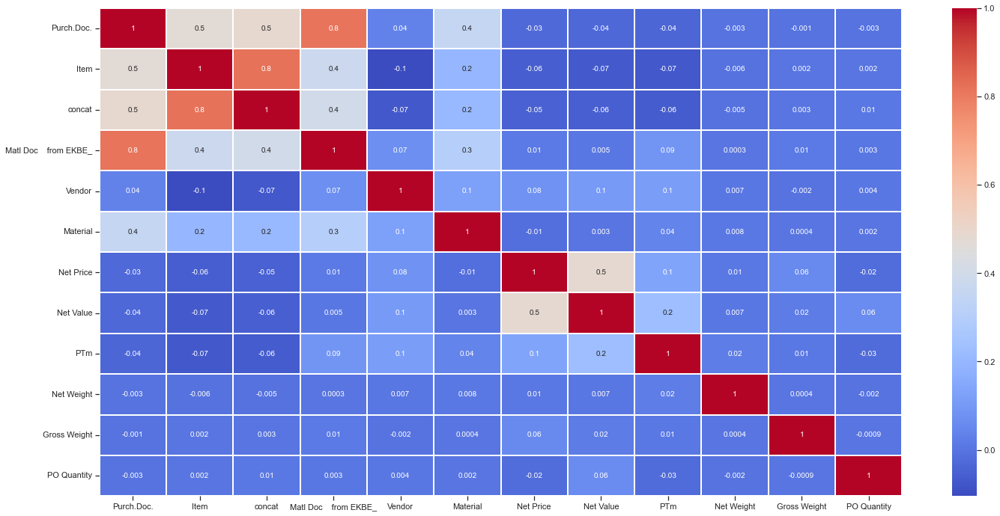

In [87]:
# Correlation matrix:  Wanted to see if certain features atribute to being late: weight, country(not numeric), volume :

fig, ax = plt.subplots(figsize=(24,12))         # figsize
sns.heatmap(vendor_data.corr(),annot=True,linewidths=.3,fmt='.1g',cmap= 'coolwarm') # Heatmap for correlation matrix

# Analsysis: By # Purchase Orders:

In [88]:
# Order countries map plot:

df_geo=vendor_data.groupby([ 'Vendor Country full'])['concat'].count().reset_index(name='num of orders').sort_values(by= 'num of orders', ascending= False)

df_geo

,Vendor Country full,num of orders
12,United States,14942
8,Singapore,1119
1,China,923
10,Taiwan,502
6,Malaysia,405
9,South Korea,215
4,Japan,153
7,Mexico,84
3,Israel,79
5,Liechtenstein,67


In [89]:
#  Global Heat Map:

import plotly.express as px


fig = px.choropleth(df_geo ,  locationmode='country names', locations='Vendor Country full',
                    color='num of orders', # lifeExp is a column of data
                    hover_name='Vendor Country full', 
                    #hover_data ='Order City',
                    color_continuous_scale=px.colors.sequential.Plasma)

fig.show()

In [90]:
# Material Group by count:

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns; sns.set(style="ticks", color_codes=True)
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import seaborn as sns
import plotly.express as px
%matplotlib inline



In [91]:
# Number of Orders by Vendor Country:

data_Category_Name=vendor_data.groupby(['Vendor Country'])['concat'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= True)
px.bar(data_Category_Name, x='Number of Orders',y = 'Vendor Country',color ='Number of Orders')

In [92]:
# Number of Orders by region:

data_Category_Name=vendor_data.groupby(['region'])['concat'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= True)
px.bar(data_Category_Name, x='Number of Orders',y = 'region',color ='Number of Orders')

In [94]:
# Number of Orders by supplier mgmt:

data_Category_Name=vendor_data.groupby(['supplier mgmt'])['concat'].count().reset_index(name='Number of Orders').sort_values(by= 'Number of Orders', ascending= True)
px.bar(data_Category_Name, x='Number of Orders',y = 'supplier mgmt',color ='Number of Orders')

# Analysis : By $:

<AxesSubplot:title={'center':'Total sales for all regions'}, xlabel='region'>

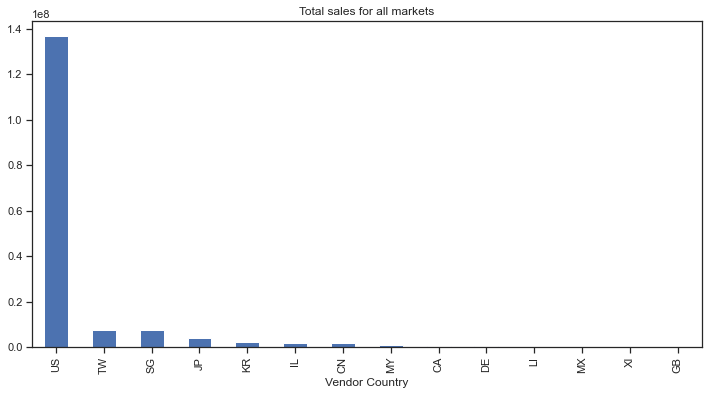

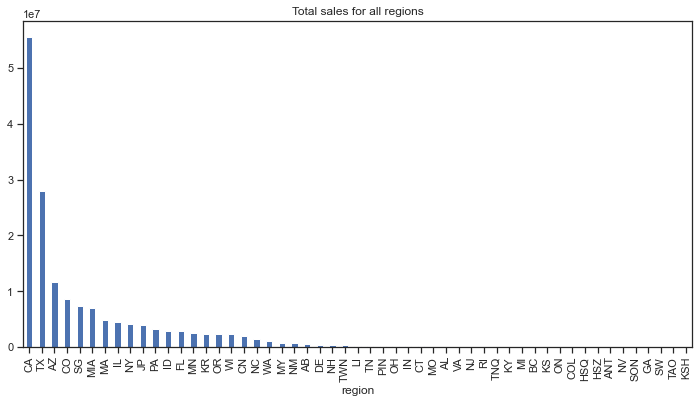

In [95]:
# COMPARING Total Material cost by Vendor country, Region:

vendor_country = vendor_data.groupby('Vendor Country') #Grouping by market
Region = vendor_data.groupby('region')
plt.figure(1)#
vendor_country['Net Value'].sum().sort_values(ascending=False).plot.bar(figsize=(12,6), title="Total sales for all markets")
plt.figure(2)
Region['Net Value'].sum().sort_values(ascending=False).plot.bar(figsize=(12,6), title="Total sales for all regions")



<AxesSubplot:title={'center':'Total sales for all regions'}, xlabel='Material'>

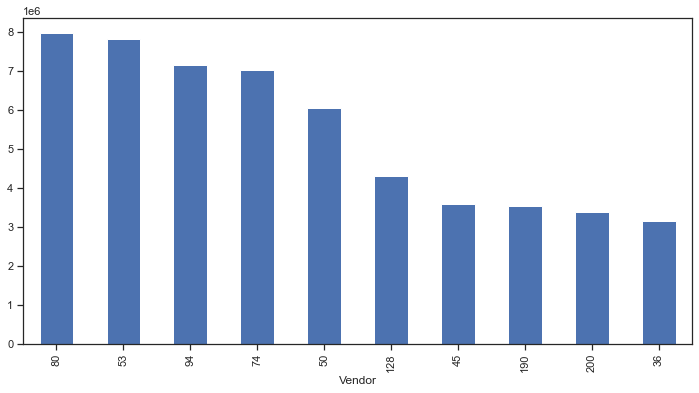

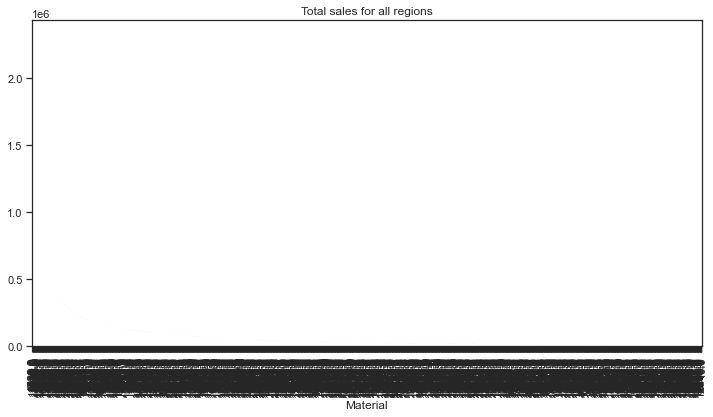

In [96]:
# COMPARING Total $  material cost by Vendor, Material:

vendor = vendor_data.groupby('Vendor') #Grouping by market
material = vendor_data.groupby('Material')
plt.figure(1)
vendor['Net Value'].sum().sort_values(ascending=False)[:10].plot.bar(figsize=(12,6), title="")
plt.figure(2)
material['Net Value'].sum().sort_values(ascending=False)[:10].plot.bar(figsize=(12,6), title="Total sales for all regions")



# Days Late

In [97]:
# CREATING DATE CALCULATION FOR DAYS LATE:

import datetime
from dateutil.relativedelta import relativedelta
from datetime import date

# Calculate diff betwee two dates
vendor_data['diff_days']=vendor_data['EKET DELIVERY DATE']-vendor_data['Post Date_from EKBE_']

# convert to days diff:
vendor_data['diff_days']=vendor_data['diff_days']/np.timedelta64(1,'D')


In [98]:
# add colunn = Late, Ontime:

# First, remove blanks from 'diff_days':
vendor_data.dropna(subset=['diff_days'], inplace=True)

# Reassign logic values to string values:
vendor_data['On Time']= np.where(vendor_data['diff_days'] >=0,'POSITIVE','NEGATIVE') 


In [99]:
# Print column / Verify values:

vendor_data['On Time']

0        NEGATIVE
1        NEGATIVE
2        POSITIVE
4        POSITIVE
5        NEGATIVE
           ...   
25208    POSITIVE
25209    NEGATIVE
25210    POSITIVE
25211    POSITIVE
25212    NEGATIVE
Name: On Time, Length: 18534, dtype: object

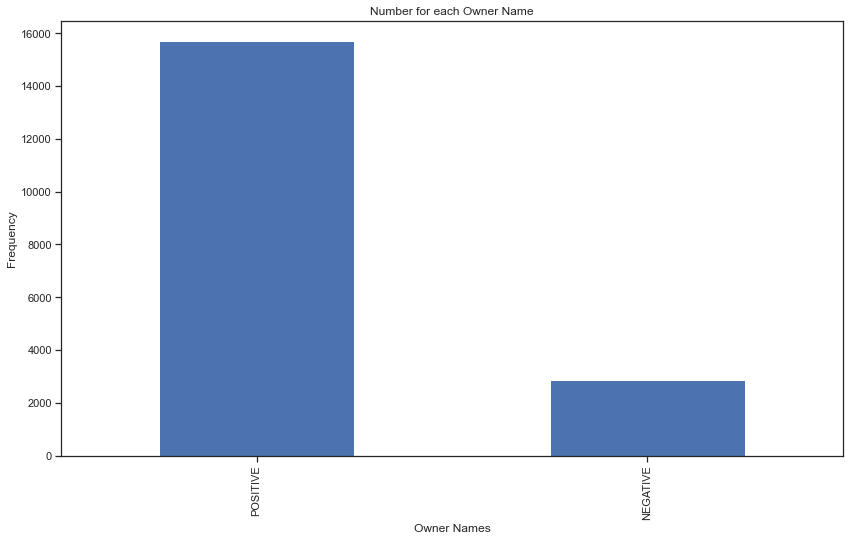

In [100]:
# Plot of On time / Late:

ax = vendor_data['On Time'].value_counts().plot(kind='bar',
                                    figsize=(14,8),
                                    title="Number for each Owner Name")
ax.set_xlabel("Owner Names")
ax.set_ylabel("Frequency")
plt.show()

In [101]:
#conda install altair

In [102]:
# Days Late: By Region: 

import altair as alt
alt.data_transformers.enable('default', max_rows=None)

source = vendor_data

alt.Chart(source).mark_bar().encode(
    x='count(Vendor)',
    y='region',
    color='On Time',
    order=alt.Order(
      # Sort the segments of the bars by this field
      'On Time',
      sort='ascending'
    )
)

alt.Chart(...)

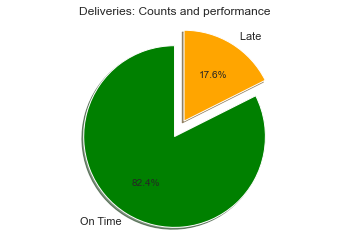

In [103]:
#Days Late: Pie Chart: 

labels= ['On Time', ' Late']

colors=[ 'green', 'orange']

sizes= [20747, 4427]

plt.pie(sizes,labels=labels, colors=colors, startangle=90, shadow=True,explode=(0.1, 0.1),autopct='%1.1f%%')

plt.title('Deliveries: Counts and performance')

plt.axis('equal')

plt.show()




In [104]:
# Print dataframe:

vendor_data.head(5)


,Purch.Doc.,Item,concat,EKET DELIVERY DATE,EKET Stat.Rel Del Date,EKET Orig. Del Date,Matl Doc from EKBE_,Doc date _from EKBE USING Matl Doc_,Doc date _from EKBE USING PURCH&ITEM_,Post Date_from EKBE_,...,Matl Group,Matl Grp Desc,Net Price,Net Value,PTm,Net Weight,Gross Weight,PO Quantity,diff_days,On Time
0,4507569605,10,450756960510,2018-10-18,2018-10-18,2018-10-25,5.025624e+09,2018-10-19,2018-10-19,2018-10-19,...,DC4016,ASSY ELECTRICAL,64900.0,64900.0,67,0.00,0.0,1.0,-1.0,NEGATIVE
1,4507569605,20,450756960520,2019-04-22,2019-04-15,2019-02-20,5.027705e+09,2018-10-20,2019-04-24,2019-04-24,...,DC4016,ASSY ELECTRICAL,64900.0,64900.0,67,0.01,0.0,1.0,-2.0,NEGATIVE
2,4507569605,30,450756960530,2019-04-24,2019-04-24,2019-06-01,5.027705e+09,2018-10-21,2019-04-24,2019-04-24,...,DC4016,ASSY ELECTRICAL,0.0,0.0,67,0.01,0.0,1.0,0.0,POSITIVE
4,4507807360,10,450780736010,2018-10-12,2018-10-12,2018-05-15,5.025485e+09,2018-10-23,2018-10-11,2018-10-11,...,DC4016,ASSY ELECTRICAL,2175.0,2175.0,67,0.01,0.0,1.0,1.0,POSITIVE
5,4507807360,20,450780736020,2018-10-05,2018-10-05,2018-05-15,5.025453e+09,2018-10-24,2018-10-09,2018-10-09,...,DC4016,ASSY ELECTRICAL,1675.0,1675.0,67,0.01,0.0,1.0,-4.0,NEGATIVE


<AxesSubplot:title={'center':'Days Late'}, xlabel='Vendor Country'>

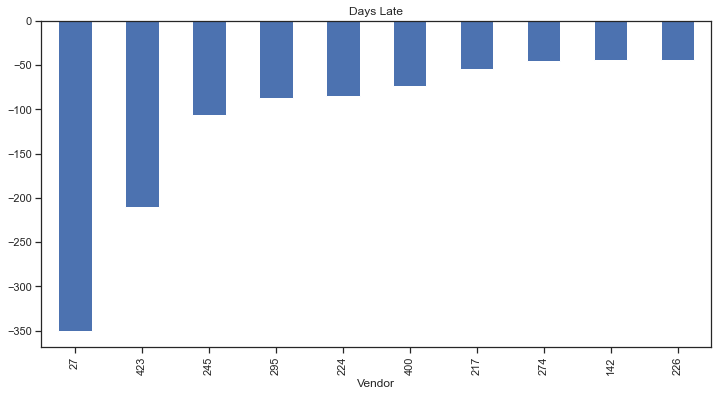

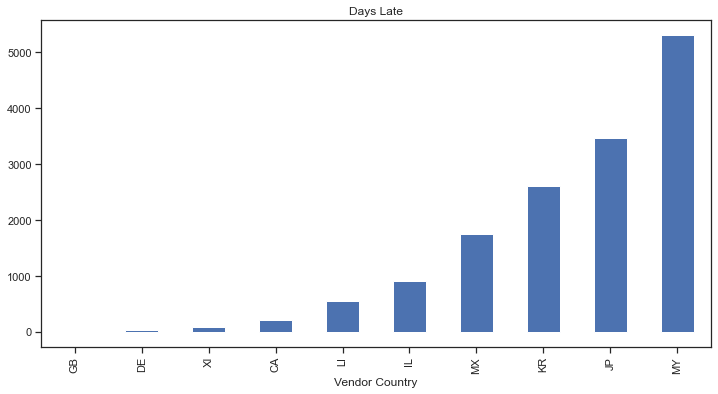

In [105]:
# Comparing days late by Vendor, Vendor country:

vendor = vendor_data.groupby('Vendor') #Grouping by market
vendor_Country = vendor_data.groupby('Vendor Country')
plt.figure(1)#
vendor['diff_days'].sum().sort_values(ascending=True)[:10].plot.bar(figsize=(12,6), title="Days Late")
plt.figure(2)
vendor_Country['diff_days'].sum().sort_values(ascending=True)[:10].plot.bar(figsize=(12,6), title="Days Late")


<AxesSubplot:title={'center':'Days Late'}, xlabel='Matl Grp Desc'>

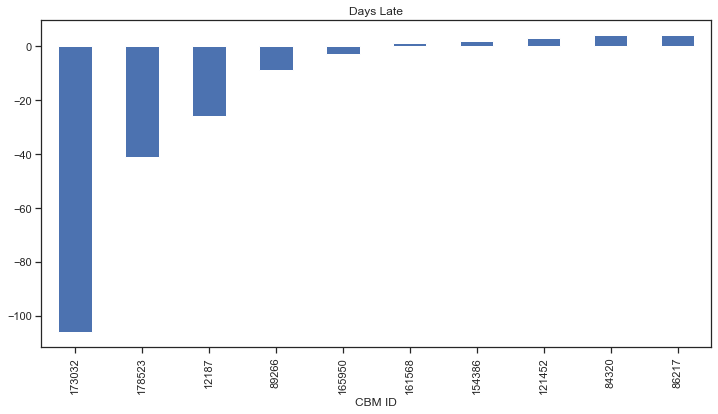

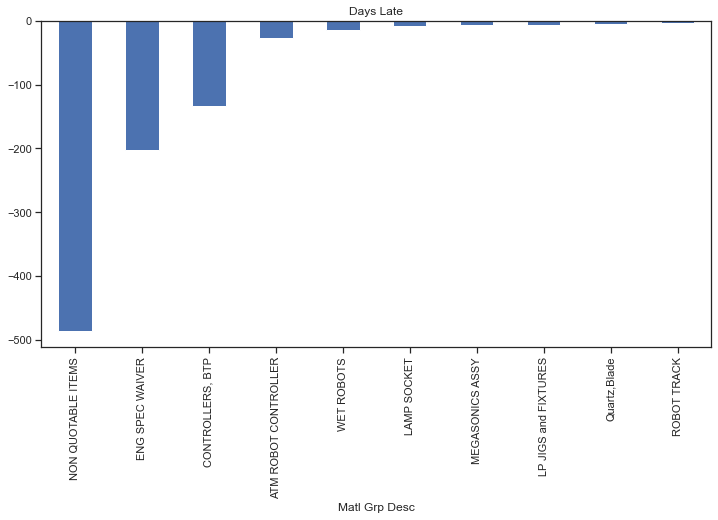

In [106]:
# Comparing days late by Material group , CBM:

vendor = vendor_data.groupby('CBM ID') #Grouping by market
material = vendor_data.groupby('Matl Grp Desc')
plt.figure(1)#
vendor['diff_days'].sum().sort_values(ascending=True)[:10].plot.bar(figsize=(12,6), title="Days Late")
plt.figure(2)
material['diff_days'].sum().sort_values(ascending=True)[:10].plot.bar(figsize=(12,6), title="Days Late")


In [107]:
#Filtering orders with late delivery risk

xyz1 = vendor_data[(vendor_data['On Time'] == 'NEGATIVE')]
#Filtering late delivered orders
xyz2 = vendor_data[(vendor_data['On Time'] == 'POSITIVE')]
count1=xyz1['Vendor Country'].value_counts()
count2=xyz2['Vendor Country'].value_counts()
#Index names
names=vendor_data['Vendor Country'].value_counts().keys()


<AxesSubplot:xlabel='Vendor Country', ylabel='count'>

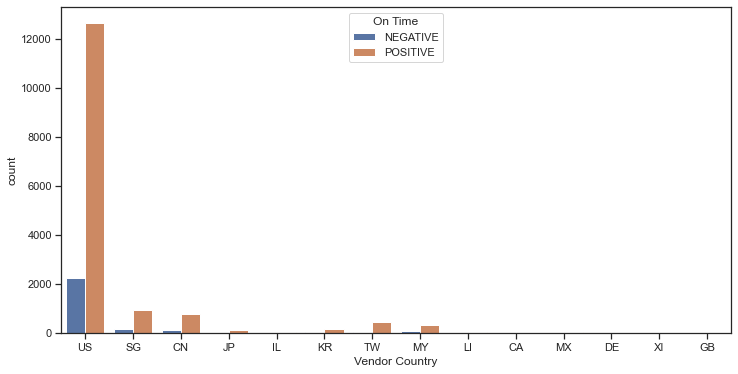

In [108]:
#Graph - Days Late Count by Vendor Country :

fig, ax = plt.subplots(figsize=(12,6))
sns.countplot(data=vendor_data, x='Vendor Country', hue='On Time', ax=ax)

[Text(0, 0, '29'),
 Text(1, 0, '4'),
 Text(2, 0, '81'),
 Text(3, 0, '24'),
 Text(4, 0, '20'),
 Text(5, 0, '8'),
 Text(6, 0, '49'),
 Text(7, 0, '74'),
 Text(8, 0, '46'),
 Text(9, 0, '106'),
 Text(10, 0, '53'),
 Text(11, 0, '52'),
 Text(12, 0, '43'),
 Text(13, 0, '111'),
 Text(14, 0, '97'),
 Text(15, 0, '90'),
 Text(16, 0, '109'),
 Text(17, 0, '121'),
 Text(18, 0, '197'),
 Text(19, 0, '54'),
 Text(20, 0, '41')]

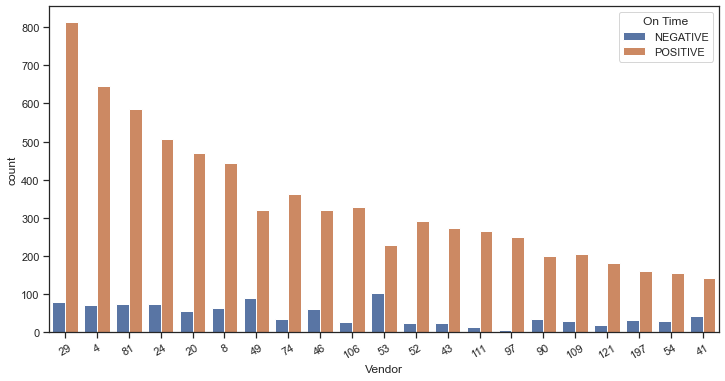

In [109]:
#Graph- Vendor On Time by days Late: 

# df_vendor_latest= vendor_data.nsmallest(20,'diff_days')
#plot_order = vendor_data.groupby('Vendor')(vendor_data=='Negative').sum().sort_values(ascending=False).index.values
plot_order = vendor_data.groupby('Vendor')['On Time'].count().sort_values(ascending=False).index.values


#vendor_20= vendor_data.nsmallest(20,'diff_days')

fig, ax = plt.subplots(figsize=(12,6))
sns.countplot(data=vendor_data, x='Vendor', hue='On Time', ax=ax,order=plot_order[1:22])
ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)


[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

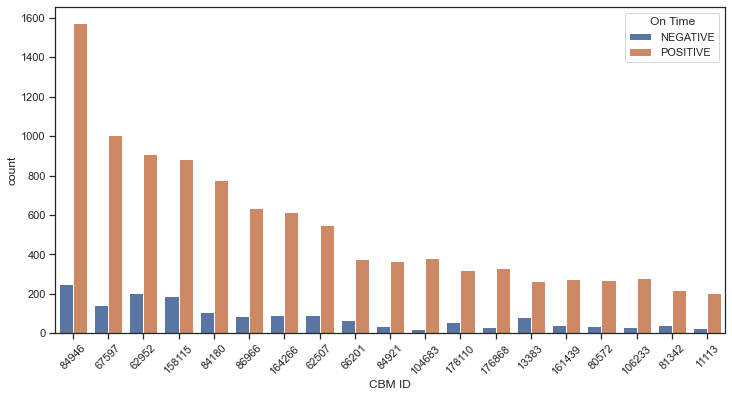

In [110]:
#Graph- CBM ID by Days Late: 


fig, ax = plt.subplots(figsize=(12,6))
plot_order = vendor_data.groupby('CBM ID')['On Time'].count().sort_values(ascending=False).index.values

sns.countplot(data=vendor_data, x='CBM ID', hue='On Time', ax=ax,order=plot_order[1:20])
#sns.countplot(data=vendor_data, x='CBM ID', hue='On Time', ax=ax)

locs, labels = plt.xticks()
plt.setp(labels,rotation=45)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

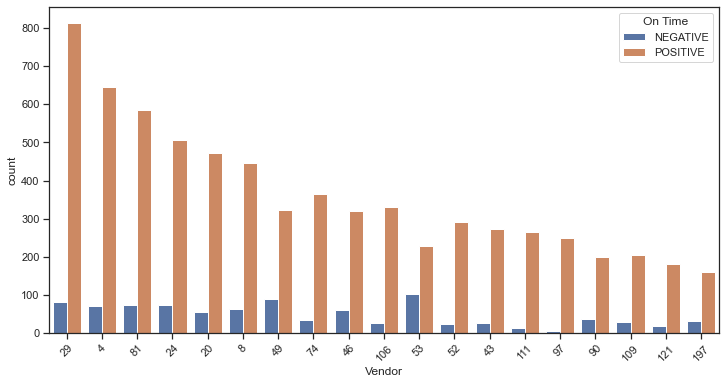

In [111]:
#Graph- Vendor by Days Late: 

fig, ax = plt.subplots(figsize=(12,6))

plot_order = vendor_data.groupby('Vendor')['On Time'].count().sort_values(ascending=False).index.values

#sns.countplot(data=vendor_data, x='Vendor', hue='On Time', ax=ax,order=plot_order)
sns.countplot(data=vendor_data, x='Vendor', hue='On Time', ax=ax,order=plot_order[1:20])
locs, labels = plt.xticks()
plt.setp(labels,rotation=45)


#plot_order = death.groupby('Cause Name')['Deaths'].sum().sort_values(ascending=False).index.values

#sns.catplot(data=death, x='Cause Name',  y='Deaths',kind='bar',ci=None, legend_out=False, order=plot_order[1:6])

In [112]:
# View all column names:

vendor_data.columns

Index(['Purch.Doc.', 'Item', 'concat', 'EKET DELIVERY DATE',
       'EKET Stat.Rel Del Date', 'EKET Orig. Del Date',
       'Matl Doc    from EKBE_', 'Doc date _from EKBE USING Matl Doc_',
       'Doc date _from EKBE USING PURCH&ITEM_', 'Post Date_from EKBE_',
       'Vendor', 'CBM ID', 'supplier mgmt', 'region', 'created on',
       'Vendor Country', 'Vendor Country full', 'Material', 'Matl Group',
       'Matl Grp Desc', 'Net Price', 'Net Value', 'PTm', 'Net Weight',
       'Gross Weight', 'PO Quantity', 'diff_days', 'On Time'],
      dtype='object')

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

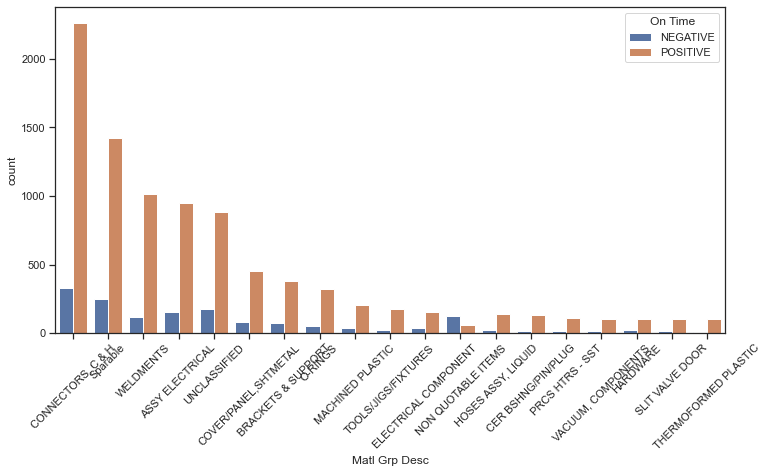

In [113]:
#Graph- Matl Group Desc by Days Late: 

fig, ax = plt.subplots(figsize=(12,6))
plot_order = vendor_data.groupby('Matl Grp Desc')['On Time'].count().sort_values(ascending=False).index.values


sns.countplot(data=vendor_data, x='Matl Grp Desc', hue='On Time', ax=ax,order=plot_order[1:20])
locs, labels = plt.xticks()
plt.setp(labels,rotation=45)

<AxesSubplot:xlabel='PTm', ylabel='count'>

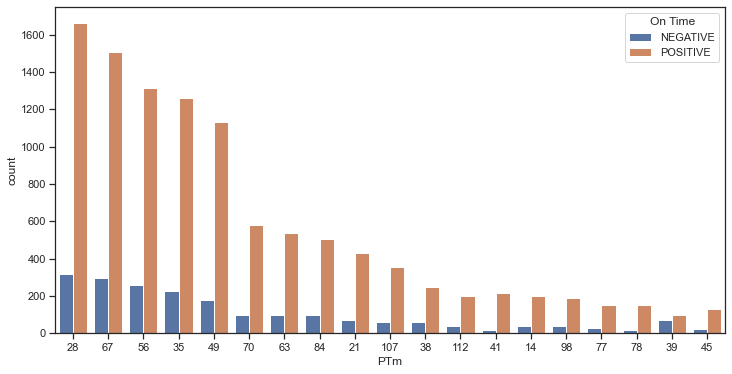

In [114]:
#Graph- Payterm by Days Late: 


fig, ax = plt.subplots(figsize=(12,6))
plot_order = vendor_data.groupby('PTm')['On Time'].count().sort_values(ascending=False).index.values

sns.countplot(data=vendor_data, x='PTm', hue='On Time', ax=ax,order=plot_order[1:20])

# MODELLING 

In [115]:
# Copy of vendor data dataframe :

train_data=vendor_data.copy()

In [116]:
# Create new column 'late_delivery' based on 'On Time' column:

train_data['late_delivery']=np.where(train_data['On Time'] == 'NEGATIVE', 1, 0)

In [117]:
# View all column names:

train_data.columns

Index(['Purch.Doc.', 'Item', 'concat', 'EKET DELIVERY DATE',
       'EKET Stat.Rel Del Date', 'EKET Orig. Del Date',
       'Matl Doc    from EKBE_', 'Doc date _from EKBE USING Matl Doc_',
       'Doc date _from EKBE USING PURCH&ITEM_', 'Post Date_from EKBE_',
       'Vendor', 'CBM ID', 'supplier mgmt', 'region', 'created on',
       'Vendor Country', 'Vendor Country full', 'Material', 'Matl Group',
       'Matl Grp Desc', 'Net Price', 'Net Value', 'PTm', 'Net Weight',
       'Gross Weight', 'PO Quantity', 'diff_days', 'On Time', 'late_delivery'],
      dtype='object')

In [118]:
# REMOVING COLUMNS WITH UNNECCESSARY COLUMNS (duplicates, etc)

train_data.drop(['EKET DELIVERY DATE','Post Date_from EKBE_','created on','Purch.Doc.','Item','EKET Stat.Rel Del Date','EKET Orig. Del Date','Matl Doc    from EKBE_','Doc date _from EKBE USING Matl Doc_','Doc date _from EKBE USING PURCH&ITEM_','Matl Group','On Time','diff_days','Vendor Country full'], axis=1, inplace=True)

In [119]:
train_data.describe()

,concat,Vendor,Material,Net Price,Net Value,PTm,Net Weight,Gross Weight,PO Quantity,late_delivery
count,1.853400e+04,18534.000000,18534.000000,18534.000000,1.853400e+04,18534.000000,18534.000000,1.853400e+04,18534.000000,18534.000000
mean,2.248697e+11,94.942646,7221.178429,2584.194154,8.856884e+03,55.396299,6.670040,9.089207e+01,10.006151,0.153664
std,5.589299e+11,84.487448,4437.915960,12147.248906,3.703278e+04,32.016549,295.599588,1.187173e+04,72.231119,0.360636
min,4.507866e+10,1.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,1.000000,0.000000
25%,4.507871e+10,29.000000,3301.250000,75.710000,1.990000e+02,35.000000,0.010000,0.000000e+00,1.000000,0.000000
50%,4.507875e+10,74.000000,6953.500000,249.850000,6.661700e+02,49.000000,0.170000,0.000000e+00,2.000000,0.000000
75%,4.507870e+11,129.000000,11133.000000,890.550000,3.017955e+03,67.000000,1.000000,0.000000e+00,6.000000,0.000000
max,4.510013e+12,484.000000,15370.000000,452804.000000,1.346120e+06,511.000000,28000.000000,1.616000e+06,4000.000000,1.000000


In [120]:
# drop rows with blanks:

train_data.dropna(subset=['CBM ID'], inplace=True)
train_data.dropna(subset=['supplier mgmt'], inplace=True)
train_data.dropna(subset=['Matl Grp Desc'], inplace=True)
train_data.dropna(subset=['Material'], inplace=True)

In [121]:
# CBM values matching 'unassigned', change to NaN :

train_data.loc[train_data["CBM ID"] == "UNASSIGNED"] = 0
train_data.loc[train_data["CBM ID"] == "N/A"] = 0
#train_data.loc[train_data["supplier mgmt"] == "UNASSIGNED"] = 0
#train_data.loc[train_data["supplier mgmt"] == "N/A"] = 0

# Now that CBM ID & supplier mgmt are '0' for blanks, remove them:
train_data.dropna(subset=['CBM ID'], inplace=True)
train_data.dropna(subset=["supplier mgmt"], inplace=True)

# converting CBM ID from object to float:

train_data.astype({'CBM ID': 'int64'}).dtypes

concat              int64
Vendor              int64
CBM ID              int64
supplier mgmt      object
region             object
Vendor Country     object
Material          float64
Matl Grp Desc      object
Net Price         float64
Net Value         float64
PTm                 int64
Net Weight        float64
Gross Weight      float64
PO Quantity       float64
late_delivery       int32
dtype: object

In [122]:
# force data type field to str:

train_data['supplier mgmt']=train_data['supplier mgmt'].astype(str)
train_data['region']=train_data['region'].astype(str)
train_data['Vendor Country']=train_data['Vendor Country'].astype(str)
train_data['Material']=train_data['Material'].astype(str)
train_data['Matl Grp Desc']=train_data['Matl Grp Desc'].astype(str)


In [123]:
# Copy of df to new name:

train_data2 = train_data.copy()

In [124]:
train_data2.head(5)

,concat,Vendor,CBM ID,supplier mgmt,region,Vendor Country,Material,Matl Grp Desc,Net Price,Net Value,PTm,Net Weight,Gross Weight,PO Quantity,late_delivery
0,450756960510,1,81342,OEM-POWER/PUMP-SUPPLIER,CA,US,1.0,ASSY ELECTRICAL,64900.0,64900.0,67,0.00,0.0,1.0,1
1,450756960520,1,81342,OEM-POWER/PUMP-SUPPLIER,CA,US,1.0,ASSY ELECTRICAL,64900.0,64900.0,67,0.01,0.0,1.0,1
2,450756960530,1,81342,OEM-POWER/PUMP-SUPPLIER,CA,US,1.0,ASSY ELECTRICAL,0.0,0.0,67,0.01,0.0,1.0,0
4,450780736010,3,13383,OEM-POWER/PUMP-SUPPLIER,CO,US,2.0,ASSY ELECTRICAL,2175.0,2175.0,67,0.01,0.0,1.0,0
5,450780736020,3,13383,OEM-POWER/PUMP-SUPPLIER,CO,US,3.0,ASSY ELECTRICAL,1675.0,1675.0,67,0.01,0.0,1.0,1


# 1st Analytic model : 

In [125]:
# Perform le.fit. transform on 5 key features:

le =LabelEncoder()


train_data['supplier mgmt'] = le.fit_transform(train_data['supplier mgmt'])
train_data['region'] = le.fit_transform(train_data['region'])
train_data['Vendor Country'] = le.fit_transform(train_data['Vendor Country'])
train_data['Material'] = le.fit_transform(train_data['Material'])
train_data['Matl Grp Desc'] = le.fit_transform(train_data['Matl Grp Desc'])
train_data['CBM ID'] = le.fit_transform(train_data['CBM ID'])


train_data.head()

,concat,Vendor,CBM ID,supplier mgmt,region,Vendor Country,Material,Matl Grp Desc,Net Price,Net Value,PTm,Net Weight,Gross Weight,PO Quantity,late_delivery
0,450756960510,1,25,24,5,13,1,1,64900.0,64900.0,67,0.00,0.0,1.0,1
1,450756960520,1,25,24,5,13,1,1,64900.0,64900.0,67,0.01,0.0,1.0,1
2,450756960530,1,25,24,5,13,1,1,0.0,0.0,67,0.01,0.0,1.0,0
4,450780736010,3,4,24,7,13,5696,1,2175.0,2175.0,67,0.01,0.0,1.0,0
5,450780736020,3,4,24,7,13,6662,1,1675.0,1675.0,67,0.01,0.0,1.0,1


In [126]:
#All columns expect Late delivery column:

xl=train_data.loc[:, train_data.columns != 'late_delivery']

#Only fraud column
yl=train_data['late_delivery']
#Splitting the data into two parts in which 80% data will be used for training the model and 20% for testing
xl_train, xl_test,yl_train,yl_test = train_test_split(xl,yl,test_size = 0.2, random_state = 42)

In [127]:
# Show column data types: 

xl_train.dtypes

concat              int64
Vendor              int64
CBM ID              int32
supplier mgmt       int32
region              int32
Vendor Country      int32
Material            int32
Matl Grp Desc       int32
Net Price         float64
Net Value         float64
PTm                 int64
Net Weight        float64
Gross Weight      float64
PO Quantity       float64
dtype: object

In [128]:
# StandarScaler :  

sc = StandardScaler()

xl_train=sc.fit_transform(xl_train)
xl_test=sc.transform(xl_test)
yl_test.describe()

count    3707.000000
mean        0.149717
std         0.356842
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         1.000000
Name: late_delivery, dtype: float64

In [129]:
# Function to model and print results:

def classifiermodel(model_l,xl_train, xl_test,yl_train,yl_test):
    model_l=model_l.fit(xl_train,yl_train) # Fitting train data for predection of late delivery
    yl_pred=model_l.predict(xl_test)  
    accuracy_l=accuracy_score(yl_pred, yl_test) #Accuracy for predection of late delivery
    recall_l=recall_score(yl_pred, yl_test)# Recall score for predection of late delivery
    conf_l=confusion_matrix(yl_test, yl_pred)#predection of late delivery
    f1_l=f1_score(yl_test, yl_pred)#predection of late delivery

    print('Accuracy of late delivery status is:', (accuracy_l)*100,'%')
    print('Recall score of late delivery status is:', (recall_l)*100,'%')
    print('Conf Matrix of late delivery status is: \n',(conf_l))
    print('F1 score of late delivery status is:', (f1_l)*100,'%')
    ax = sns.heatmap(conf_l, annot=True, cmap='Blues',fmt='d')
    ax.set_title(' : Seaborn Confusion Matrix with labels\n\n');
    ax.set_xlabel('\nPredicted Values')
    ax.set_ylabel('Actual Values ');
    ## Ticket labels - List must be in alphabetical order
    ax.xaxis.set_ticklabels(['False','True'])
    ax.yaxis.set_ticklabels(['False','True'])
    ## Display the visualization of the Confusion Matrix.
    plt.show()
    
    
    #y_pred_proba = model_l.predict(xl_test)
    #yl_pred
    fpr, tpr, _ = metrics.roc_curve(yl_test, yl_pred)
    auc = metrics.roc_auc_score(yl_test, yl_pred)
    plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
    plt.legend(loc=4)
    plt.show()

Accuracy of late delivery status is: 85.02832479093607 %
Recall score of late delivery status is: 50.0 %
Conf Matrix of late delivery status is: 
 [[3143    9]
 [ 546    9]]
F1 score of late delivery status is: 3.1413612565445024 %


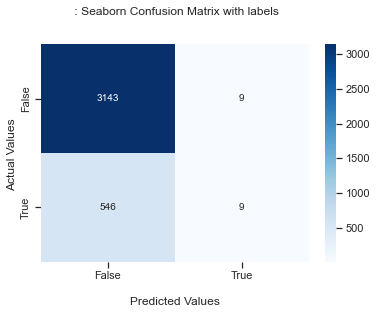

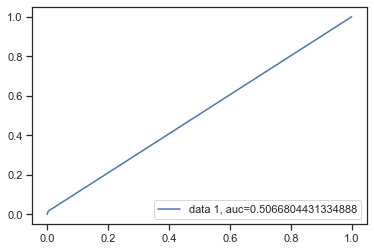

In [130]:
# LogisticRegression model:

model_l = LogisticRegression(solver='lbfgs',random_state=0) #the classification model
#Giving inputs to the defined function
classifiermodel(model_l,xl_train, xl_test,yl_train,yl_test)



>1 mean=0.8680 se=0.011
>2 mean=0.8675 se=0.008
>3 mean=0.8673 se=0.006
>4 mean=0.8670 se=0.006
>5 mean=0.8658 se=0.005
>6 mean=0.8655 se=0.004
>7 mean=0.8651 se=0.004
>8 mean=0.8651 se=0.004
>9 mean=0.8656 se=0.003
>10 mean=0.8658 se=0.003
>11 mean=0.8655 se=0.003
>12 mean=0.8654 se=0.003
>13 mean=0.8652 se=0.003
>14 mean=0.8651 se=0.003
>15 mean=0.8653 se=0.003


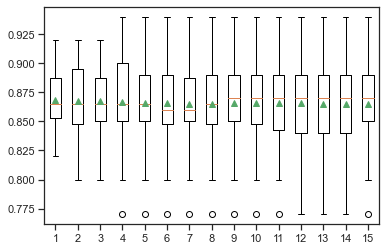

In [131]:
# Kfold Logistic Regression:

from scipy.stats import sem
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from matplotlib import pyplot
 
# evaluate a model with a given number of repeats
def evaluate_model(X, y, repeats):
    # prepare the cross-validation procedure
    cv = RepeatedKFold(n_splits=10, n_repeats=repeats, random_state=1)
    # create model
    model = LogisticRegression()
    # evaluate model
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1)
    return scores
 
# create dataset
X, y = make_classification(n_samples=1000, n_features=20, n_informative=15, n_redundant=5, random_state=1)
# configurations to test
repeats = range(1,16)
results = list()
for r in repeats:
    # evaluate using a given number of repeats
    scores = evaluate_model(X, y, r)
    # summarize
    print('>%d mean=%.4f se=%.3f' % (r, mean(scores), sem(scores)))
    # store
    results.append(scores)
# plot the results
pyplot.boxplot(results, labels=[str(r) for r in repeats], showmeans=True)
pyplot.show()

Accuracy of late delivery status is: 85.10925276503912 %
Recall score of late delivery status is: 60.0 %
Conf Matrix of late delivery status is: 
 [[3146    6]
 [ 546    9]]
F1 score of late delivery status is: 3.1578947368421053 %


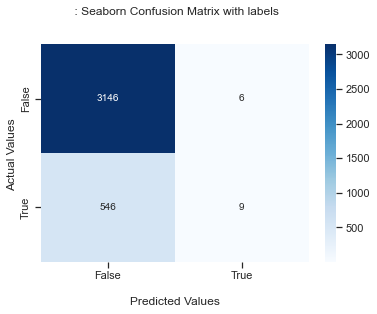

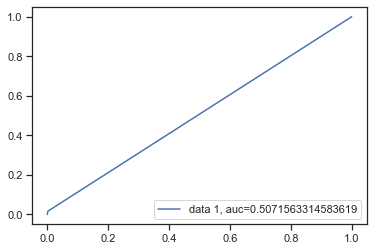

In [132]:
# LogisticRegressionCV Model:

from sklearn.linear_model import LogisticRegressionCV

#model_l = LogisticRegressionCV(solver='lbfgs',random_state=0) #the classification model
model_l = LogisticRegressionCV(cv=10, scoring='roc_auc', n_jobs=-1) #the classification model

#Giving inputs to the defined function
classifiermodel(model_l,xl_train, xl_test,yl_train,yl_test)



Accuracy of late delivery status is: 84.08416509306717 %
Recall score of late delivery status is: 33.94495412844037 %
Conf Matrix of late delivery status is: 
 [[3080   72]
 [ 518   37]]
F1 score of late delivery status is: 11.144578313253012 %


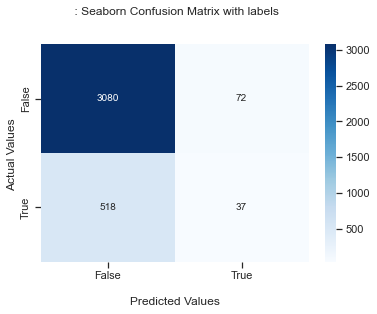

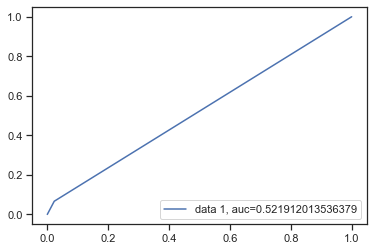

In [133]:
# GaussianNB Model:

model_l = GaussianNB()
classifiermodel(model_l,xl_train, xl_test,yl_train,yl_test)



Accuracy of late delivery status is: 85.00134879956839 %
Recall score of late delivery status is: 47.368421052631575 %
Conf Matrix of late delivery status is: 
 [[3142   10]
 [ 546    9]]
F1 score of late delivery status is: 3.1358885017421603 %


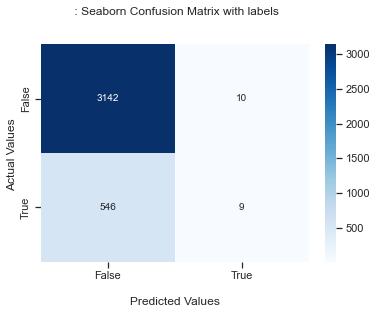

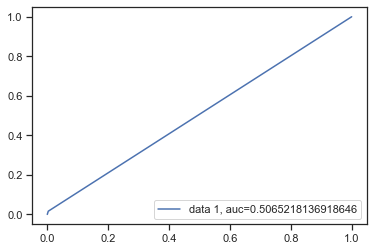

In [134]:
# LinearSVC Model:

model_l = svm.LinearSVC()
classifiermodel(model_l,xl_train, xl_test,yl_train,yl_test)



Accuracy of late delivery status is: 80.19962233612085 %
Recall score of late delivery status is: 33.57798165137615 %
Conf Matrix of late delivery status is: 
 [[2790  362]
 [ 372  183]]
F1 score of late delivery status is: 33.27272727272727 %


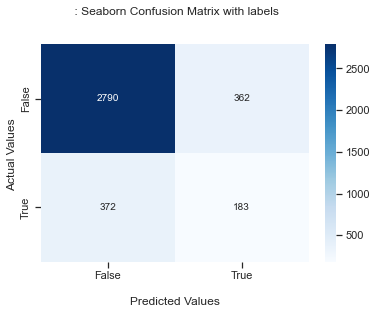

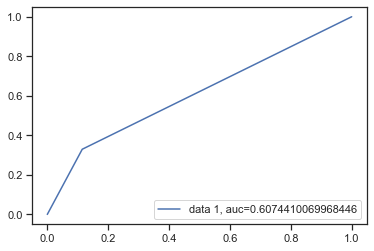

In [135]:
# KNeighborsClassifier Model:

model_l = KNeighborsClassifier(n_neighbors=1)
classifiermodel(model_l,xl_train, xl_test,yl_train,yl_test)



Accuracy of late delivery status is: 84.9743728082007 %
Recall score of late delivery status is: 46.42857142857143 %
Conf Matrix of late delivery status is: 
 [[3137   15]
 [ 542   13]]
F1 score of late delivery status is: 4.459691252144083 %


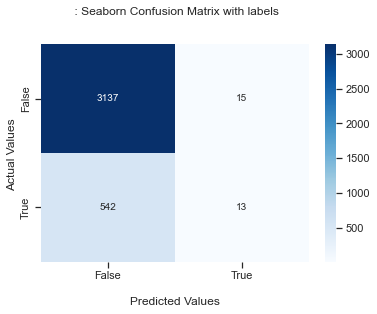

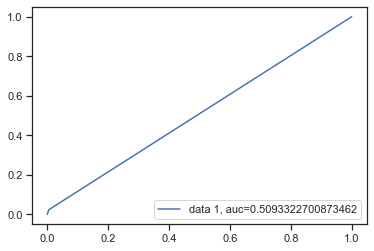

In [136]:
# LinearDiscriminantAnalysis Model:

model_l = LinearDiscriminantAnalysis()
classifiermodel(model_l, xl_train, xl_test,yl_train,yl_test)



Accuracy of late delivery status is: 85.67574858376045 %
Recall score of late delivery status is: 73.07692307692307 %
Conf Matrix of late delivery status is: 
 [[3138   14]
 [ 517   38]]
F1 score of late delivery status is: 12.520593080724876 %


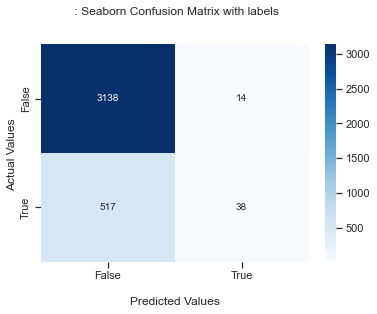

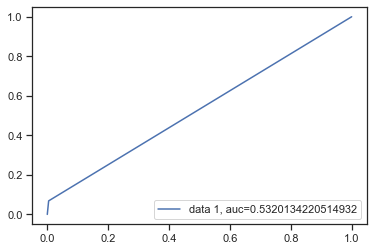

In [137]:
# RandomForestClassifier Model:

model_l = RandomForestClassifier(n_estimators=100, max_depth=10, random_state=0)
classifiermodel(model_l, xl_train, xl_test,yl_train,yl_test)



Accuracy of late delivery status is: 85.08227677367142 %
Recall score of late delivery status is: 50.35460992907801 %
Conf Matrix of late delivery status is: 
 [[3012  140]
 [ 413  142]]
F1 score of late delivery status is: 33.930704898446834 %


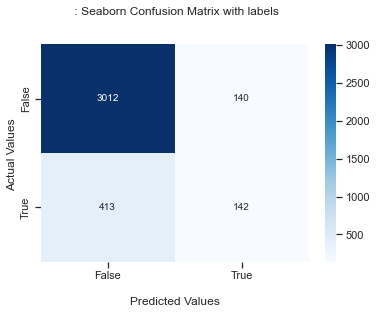

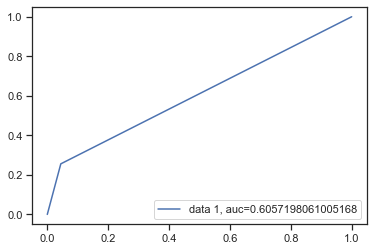

In [138]:
# ExtraTreeClassifier Model:

model_l = ExtraTreesClassifier(n_estimators=100, max_depth=None,random_state=0)
classifiermodel(model_l,xl_train, xl_test,yl_train,yl_test)



[11:04:48] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Accuracy of late delivery status is: 85.94550849743729 %
Recall score of late delivery status is: 58.415841584158414 %
Conf Matrix of late delivery status is: 
 [[3068   84]
 [ 437  118]]
F1 score of late delivery status is: 31.175693527080583 %


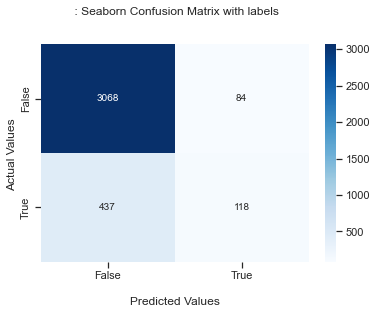

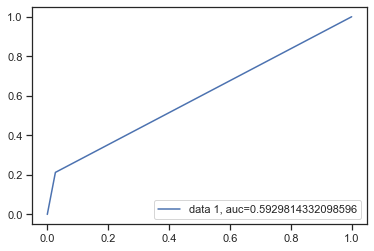

In [139]:
# XGBClassifier Model:

model_l = xgb.XGBClassifier()
classifiermodel(model_l,xl_train, xl_test,yl_train,yl_test)



Accuracy of late delivery status is: 79.09360669004586 %
Recall score of late delivery status is: 32.02614379084967 %
Conf Matrix of late delivery status is: 
 [[2736  416]
 [ 359  196]]
F1 score of late delivery status is: 33.59040274207369 %


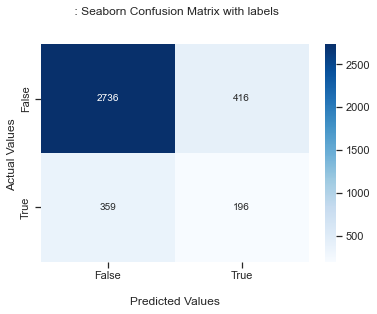

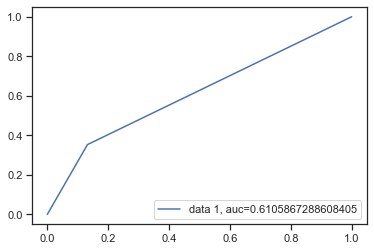

In [140]:
# DecisionTreeClassifier Model:

model_l = tree.DecisionTreeClassifier()
classifiermodel(model_l,xl_train, xl_test,yl_train,yl_test)



In [141]:
#Giving column Values

classification_data = {'Classification Model':  ['Logistic','Gausian Naive bayes','Support Vector Machines','K nearest Neighbour',
                                'Linear Discriminant Analysis','Random Forest','Extra trees','eExtreme gradient boosting','Decision tree'],
        'Accuracy Score for Late Delivery':       [85.11,16.62,85.03,80.52,84.95,85.89,84.68,85.54,78.45],
        'Recall Score for Late Delivery':         [57.89,15.11,50.0,34.16,44.83,83.33,47.67,55.76,29.73],
        'F1 Score for Late Delivery':             [3.83,26.21,3.14,33.27,4.45,13.27,31.89,25.56,30.94] }

#Creating data frame with Column Names
classification_comparision = pd.DataFrame (classification_data, columns = ['Classification Model',
                                                                           'Accuracy Score for Late Delivery','Recall Score for Late Delivery','F1 Score for Late Delivery'])

In [142]:
# Showing results of all models on a table:

classification_comparision

,Classification Model,Accuracy Score for Late Delivery,Recall Score for Late Delivery,F1 Score for Late Delivery
0,Logistic,85.11,57.89,3.83
1,Gausian Naive bayes,16.62,15.11,26.21
2,Support Vector Machines,85.03,50.00,3.14
3,K nearest Neighbour,80.52,34.16,33.27
4,Linear Discriminant Analysis,84.95,44.83,4.45
5,Random Forest,85.89,83.33,13.27
6,Extra trees,84.68,47.67,31.89
7,eExtreme gradient boosting,85.54,55.76,25.56
8,Decision tree,78.45,29.73,30.94


In [143]:
# Showing highest value in table:

classification_comparision.max() #Checking max values in every column

Classification Model                eExtreme gradient boosting
Accuracy Score for Late Delivery                         85.89
Recall Score for Late Delivery                           83.33
F1 Score for Late Delivery                               33.27
dtype: object

In [144]:
#Defining cross validation model:

def cross_validation_model(model_l,xl,yl):
    model_l = model_l.fit(xl,yl)
    scores_l = cross_val_score(model_l, xl, yl, cv=6)
    print('Cross validation accuracy of late : %0.2f (+/- %0.2f)' % (scores_l.mean(), scores_l.std() * 2))

In [145]:
cross_validation_model(model_l,xl,yl)

Cross validation accuracy of late : 0.44 (+/- 0.24)
